# Initial tests

In [1]:
from qiskit_aer import Aer
import qiskit


In [2]:
qiskit.__version__


'1.4.0'

In [3]:
qc = qiskit.QuantumCircuit(1)

qc.x(0)
qc.draw()


┌───┐
q: ┤ X ├
   └───┘

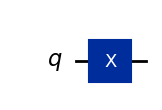

In [4]:
qc.draw('mpl')

In [5]:
backend = Aer.get_backend('statevector_simulator')
job = backend.run(qc)
result = job.result()
statevector = result.get_statevector()
print(statevector)



Statevector([0.+0.j, 1.+0.j],
            dims=(2,))


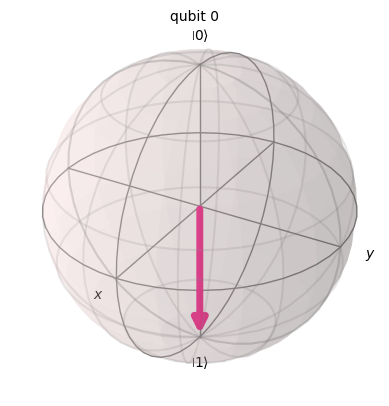

In [6]:
qiskit.visualization.plot_bloch_multivector(statevector)


In [7]:
#This does not work if we initialize a state vector
qiskit.visualization.visualize_transition(qc)

C:\Users\Przemek\AppData\Local\Temp\ipykernel_26108\2381987195.py:2: DeprecationWarning: The function ``qiskit.visualization.transition_visualization.visualize_transition()`` is deprecated as of qiskit 1.2.0. It will be removed in the 2.0 release.
  qiskit.visualization.visualize_transition(qc)


#### Let's start with [0, 1] vector

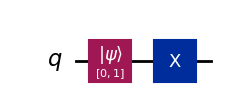

In [8]:
initial_state = [0, 1]
qc = qiskit.QuantumCircuit(1)
qc.initialize(initial_state, 0)
qc.x(0)

qc.draw('mpl')


In [9]:
backend = Aer.get_backend('statevector_simulator')
job = backend.run(qc)
result = job.result()
statevector = result.get_statevector()
print(statevector)

Statevector([1.+0.j, 0.+0.j],
            dims=(2,))


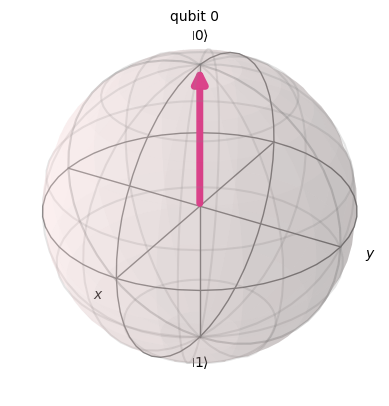

In [10]:
qiskit.visualization.plot_bloch_multivector(statevector)

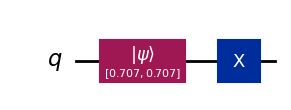

In [13]:
import math
initial_state = [1/math.sqrt(2), 1/math.sqrt(2)]
qc = qiskit.QuantumCircuit(1)
qc.initialize(initial_state, 0)
qc.x(0)
qc.draw('mpl')

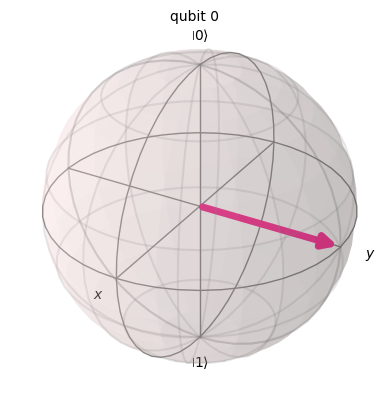

In [16]:
qc = qiskit.QuantumCircuit(1)
qc.h(0)
qc.rz(math.pi/2, 0)

qc.draw('mpl')
job = backend.run(qc)
result = job.result()
statevector = result.get_statevector()

qiskit.visualization.plot_bloch_multivector(statevector)


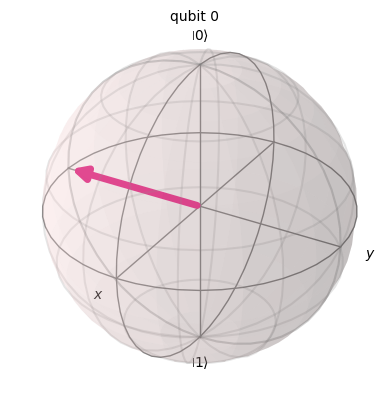

In [20]:
qc = qiskit.QuantumCircuit(1)
qc.h(0)
#qc.sg(0)
qc.sdg(0)

qc.draw('mpl')
job = backend.run(qc)
result = job.result()
statevector = result.get_statevector()

qiskit.visualization.plot_bloch_multivector(statevector)

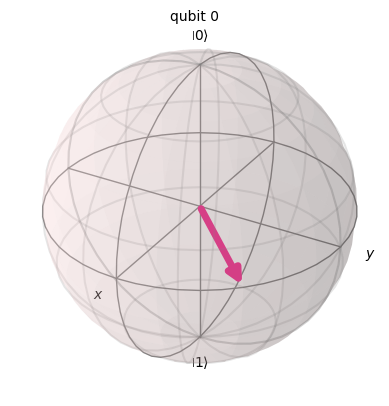

In [21]:
qc = qiskit.QuantumCircuit(1)
qc.h(0)
qc.t(0)

qc.draw('mpl')
job = backend.run(qc)
result = job.result()
statevector = result.get_statevector()

qiskit.visualization.plot_bloch_multivector(statevector)

## U Gates

---

##### $U_3$ gate is a generalized version of gates like $X$, $Y$, $H$, etc.

$
U_3(\theta, \phi, \lambda) = 
\begin{bmatrix}
\cos\frac{\theta}{2} & -e^{i\lambda} \sin\frac{\theta}{2} \\
e^{i\phi} \sin\frac{\theta}{2} & e^{i(\phi+\lambda)} \cos\frac{\theta}{2}
\end{bmatrix}
$

The parameters are $R_z(\phi), R_y(\theta), R_x(\lambda)$


---
##### $U_2$ gate has $\theta = \pi/2$
$
U_2(\phi, \lambda) = U_3(\frac{\pi}{2}, \phi, \lambda) = \frac{1}{\sqrt{2}}
\begin{bmatrix}
1 & -e^{i\lambda} \\
e^{i\phi} & e^{i(\phi+\lambda)} 
\end{bmatrix}
$

---

##### $U_1$ gate has $\theta = \phi = 0$
$
U_1(\lambda) = U_3(0, 0, \lambda) =
\begin{bmatrix}
1 & 0 \\
0 & e^{i \lambda} 
\end{bmatrix}
$


